## Imports & Initialization

In [1]:
from collections           import Counter
from sklearn.decomposition import PCA
from sklearn.linear_model  import LogisticRegressionCV
from sklearn.metrics       import roc_auc_score
from sklearn.model_selection import train_test_split
from sklearn.pipeline      import Pipeline
from sklearn.preprocessing import StandardScaler
from tqdm                  import tqdm

import json
import matplotlib              as mpl
import matplotlib.font_manager as fm
import matplotlib.pyplot       as plt
import networkx                as nx
import numpy                   as np
import os
import pandas                  as pd
import pickle
import random
import sqlite3                 as sql

In [2]:
# FLAGS TO SET
STACK_DATA_LOADED = False 

# Constants 
DATA_PATH = 'data/substacks.json'
EMBEDDINGS_PATH = 'data/embeddings.json'

RANDOM_SEED = 42

In [59]:
# Matplotlib global properties
font_path = '/Users/iyzg/Library/Fonts/Inter-Regular.otf'
prop = fm.FontProperties(fname=font_path)

# Add the font to the font manager
fm.fontManager.addfont(font_path)

# Set the font globally for all plots
plt.rcParams['font.family'] = prop.get_name()
plt.rcParams['font.sans-serif'] = [prop.get_name()]

In [3]:
class StackData:
    def __init__(self, url, name, outlinks, n_subs, category, embeddings):
        self.url = url
        self.name = name
        self.outlinks = outlinks
        self.n_subs = n_subs
        self.category = category
        self.embeddings = embeddings

    def __str__(self):
      return f"{self.name} ({self.url}, {self.n_subs} subs) [{self.category}] -> {self.outlinks}"
    # self.url + "," + self.name + "," + str(self.outlinks) + "," + str(self.n_subs)

    def toJSON(self):
        return json.dumps(self, default=lambda o: o.__dict__, 
            sort_keys=True, indent=4)

### Load data & generate statistics

In [4]:

all_substacks = {}
embeddings = {}
with open(EMBEDDINGS_PATH) as ef:
    embeds = json.load(ef)
    for embed in embeds:
        embeddings[embed['url']] = embed['embedding']

with open(DATA_PATH, 'r') as f:
    stacks = json.load(f)
    for stack in stacks:
        # print(stack['category'])
        # print(stack['url'], stack['name'], stack['outlinks'], stack['n_subs'], stack['category'])
        all_substacks[stack['url']] = StackData(stack['url'], stack['name'], stack['outlinks'], stack['n_subs'], stack['category'], embeddings[stack['url']])
            # # print(stack.keys())
            # break
        # print(d[1]['n_subs'])

In [5]:
url_to_id = {}
id_to_url = {}
id_to_name = {}

for i, url in enumerate(all_substacks.keys()):
    url_to_id[url] = i
    id_to_url[i] = url
    id_to_name[i] = all_substacks[url].name

# Count in-links for all substacks
in_links = Counter()
for s in all_substacks.values():
    for ol in s.outlinks:
        if ol in url_to_id:
            in_links[ol] += 1
# in_links['hi'] += 5
print(in_links.most_common(10))

[('https://heathercoxrichardson.substack.com/', 309), ('https://georgesaunders.substack.com/', 275), ('https://annehelen.substack.com/', 262), ('https://stevekirsch.substack.com/', 242), ('https://audacity.substack.com/', 232), ('https://austinkleon.substack.com/', 215), ('https://rwmalonemd.substack.com/', 198), ('https://greenwald.substack.com/', 192), ('https://pattismith.substack.com/', 152), ('https://tedgioia.substack.com/', 150)]


## Graph stuff!

In [6]:
# Turn into NetworkX graph

G = nx.DiGraph()
for i, url in enumerate(all_substacks.keys()):
    G.add_node(i)
    for out_link in all_substacks[url].outlinks:
        if out_link in url_to_id:
            G.add_edge(i, url_to_id[out_link])

### Important Graph stats

In [7]:
# NOTE: Only have to rerun this when graph changes
G_N = G.number_of_nodes()
G_E = G.number_of_edges()
G_K = G_E / G_N

G_CLUSTER = nx.average_clustering(G, G.nodes())
G_TRANS   = nx.transitivity(G)

G_OUTDEGREES = sorted((d for _, d in G.out_degree()))
G_INDEGREES = sorted((d for _, d in G.in_degree()))
# print(G_OUT_DEGREES[-10:], G_IN_DEGREES[-10:])

G_OUTDEGREE_MIN = G_OUTDEGREES[0]
G_OUTDEGREE_MAX = G_OUTDEGREES[-1]

G_INDEGREE_MIN = G_INDEGREES[0]
G_INDEGREE_MAX = G_INDEGREES[-1]

# G_DIA = nx.diameter(G)
# G_RAD = nx.radius(G)

# G_MAX_CLOSENESS  = max(nx.closeness_centrality(G).values())
# G_MAX_BETWEENESS = max(nx.betweenness_centrality(G).values())

print(G_N, G_E, G_K, G_CLUSTER, G_TRANS, G_OUTDEGREE_MIN, G_OUTDEGREE_MAX, G_INDEGREE_MIN, G_INDEGREE_MAX) # G_CLUSTER, G_TRANS, G_DEGREE_MIN, G_DEGREE_MAX, G_DIA, G_RAD)

21372 82058 3.839509638779712 0.1020533497186451 0.07853458319725197 0 854 1 309


### Pagerank

In [8]:

# There's defnitely some fancy numpy way to sort this
pagerank_scores = nx.pagerank(G, max_iter=1_000, alpha=0.85)
pure_scores = np.array([x for x in pagerank_scores.values()])
score_tuples = [(i, s) for i, s in pagerank_scores.items()]
score_tuples = sorted(score_tuples, key=lambda x: x[1])
# scores = np.array([x for x in pagerank_scores.values()])
score_tuples = list(map(lambda x: (id_to_url[x[0]], x[1]), score_tuples))

print(score_tuples[-10:])


[('https://jessicadefino.substack.com/', 0.0013112167540727134), ('https://joycevance.substack.com/', 0.0013264185544161421), ('https://noahpinion.substack.com/', 0.0013337090463909319), ('https://blgtylr.substack.com/', 0.001369407799005507), ('https://hunterharris.substack.com/', 0.001510262471455885), ('https://austinkleon.substack.com/', 0.0015747879488323955), ('https://annehelen.substack.com/', 0.0019317483025515238), ('https://audacity.substack.com/', 0.0021103973867494193), ('https://georgesaunders.substack.com/', 0.0021655854716049927), ('https://heathercoxrichardson.substack.com/', 0.0024094583003541337)]


In [9]:
corr_scores = np.array([x for x in pagerank_scores.values()])
corr_subs = np.array(list(map(lambda x: max(x, 0), [all_substacks[id_to_url[x]].n_subs for x in pagerank_scores.keys()])))
corr_out = np.array([len(all_substacks[id_to_url[x]].outlinks) for x in pagerank_scores.keys()])
corr_in = np.array([in_links[id_to_url[x]] for x in pagerank_scores.keys()])
corr_ids = np.array([x for x in pagerank_scores.keys()])
# corr_subs = np.array([all_substacks[id_oto_url(x)].n_subs for x in pagerank_scores.keys()])
# corr_scores, corr_subs, corr_out, corr_in, corr_ids

#### PageRank Graphs

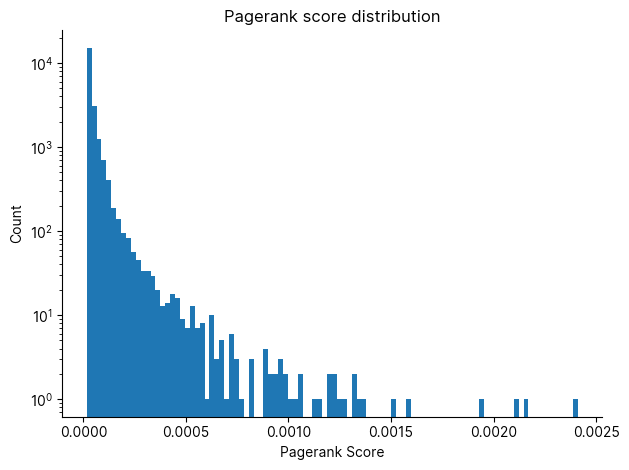

In [73]:
# print(pure_scores.min(), pure_scores.max())

mpl.rcParams['axes.spines.left'] = True
mpl.rcParams['axes.spines.right'] = False
mpl.rcParams['axes.spines.top'] = False
# plt.hist(pure_scores, bins=100, range=(0, 0.001), log=True)
# plt.figure(figsize=(20, 20))
# plt.xscale('log')
# plt.yscale('log')
plt.xlabel('Pagerank Score')
plt.ylabel('Count')
plt.title('Pagerank score distribution')
plt.hist(pure_scores, bins=100, log=True)
plt.tight_layout()
plt.savefig("images/pr_dist.png", dpi=300)
plt.show()

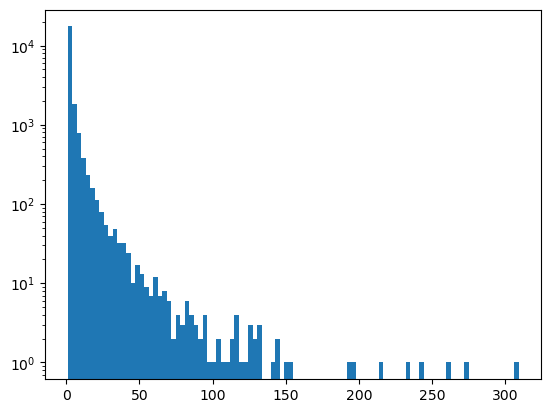

In [11]:
plt.hist(G_INDEGREES, bins=100, log=True)
plt.show()

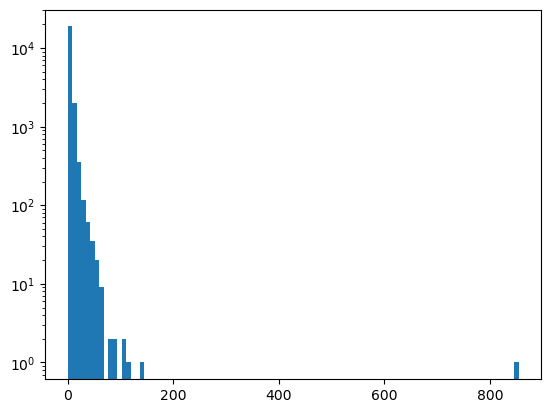

In [12]:
# plt.figure(figsize=(20, 20))
plt.hist(G_OUTDEGREES, bins=100, log=True)
plt.show()

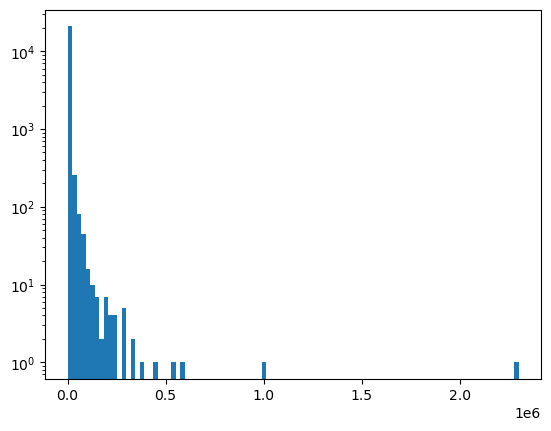

In [13]:
# plt.figure(figsize=(20, 20))
plt.hist(corr_subs, bins=100, log=True)
plt.show()

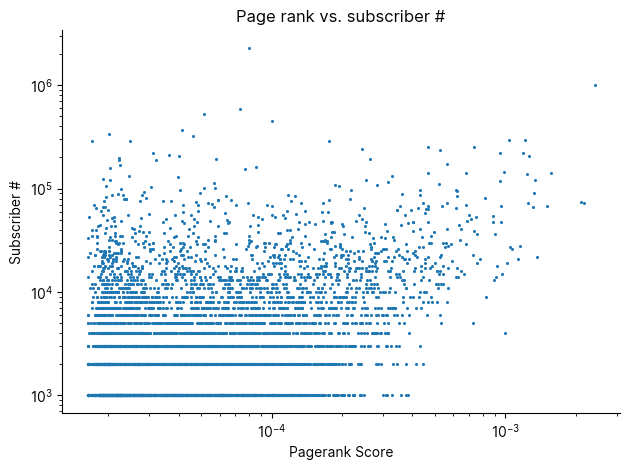

In [75]:
mpl.rcParams['axes.spines.left'] = True
mpl.rcParams['axes.spines.right'] = False
mpl.rcParams['axes.spines.top'] = False

plt.xscale('log')
plt.yscale('log')
plt.xlabel('Pagerank Score')
plt.ylabel('Subscriber #')
plt.title('Page rank vs. subscriber #')
plt.scatter(corr_scores, corr_subs, s=1.5)
plt.tight_layout()
plt.savefig("images/pr_subs.png", dpi=300)
plt.show()

Okay woah, this is kind of crazy. There's no clear correlation here between PageRank and sub counts.

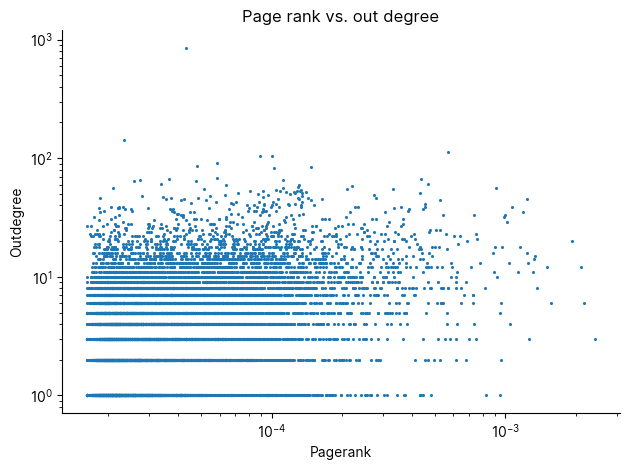

In [81]:
%matplotlib inline


# plt.rcParams['font.family'] = 'sans-serif'
# plt.rcParams['font.sans-serif'] = 'Inter Regular'




# Hide the all but the bottom spines (axis lines)
mpl.rcParams['axes.spines.left'] = True
mpl.rcParams['axes.spines.right'] = False
mpl.rcParams['axes.spines.top'] = False
# ax.spines["right"].set_visible(False)
# ax.spines["left"].set_visible(False)
# ax.spines["top"].set_visible(False)

# # Only show ticks on the left and bottom spines
# ax.yaxis.set_ticks_position("left")
# ax.xaxis.set_ticks_position("bottom")
# ax.spines["bottom"].set_bounds(min(corr_scores), max(corr_out))

# TODO: Color according to subscriber count
# plt.figure(figsize=(20, 20))
plt.xscale('log')
plt.yscale('log')
plt.xlabel('Pagerank')
plt.ylabel('Outdegree')
plt.title('Page rank vs. out degree')

plt.scatter(corr_scores, corr_out, s=1.5)
plt.tight_layout()
plt.savefig("images/pr_out.png", dpi=300)
plt.show()

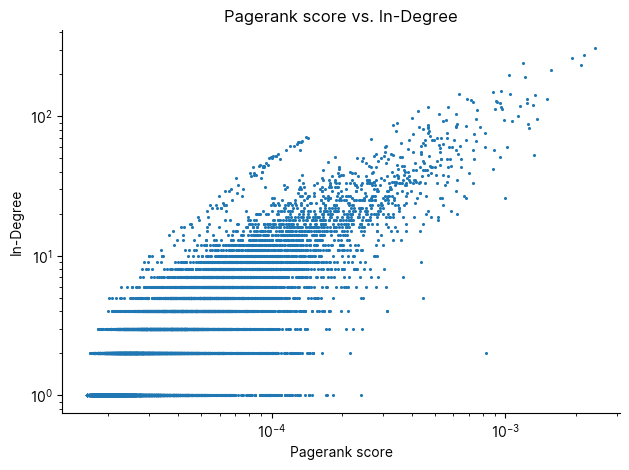

In [80]:
plt.xscale('log')
plt.yscale('log')
plt.xlabel('Pagerank score')
plt.ylabel('In-Degree')
plt.title('Pagerank score vs. In-Degree')
plt.scatter(corr_scores, corr_in, s=1.5)


plt.tight_layout()
plt.savefig("images/pr_in.png", dpi=300)
plt.show()

### Save Graph

In [17]:
nx.relabel_nodes(G, id_to_name)
nx.write_adjlist(G, 'graphs/new_substack.adjlist')

## Embedding Fun!


In [18]:
ORIG_EMBED_SIZE = 1536
embed_matrix = np.empty([len(all_substacks), ORIG_EMBED_SIZE])
# NOTE: It always pulls stuff out in same order
for i, stack in enumerate(all_substacks.values()):
    embed_matrix[i] = np.array(stack.embeddings) / np.linalg.norm(np.array(stack.embeddings))

### Word embedding PCA

In [19]:
# Do PCA
N_COMPS = 128
pca = PCA(n_components=N_COMPS)
new_embeds = pca.fit_transform(embed_matrix)
# print(pca.explained_variance_ratio_)
print('Explained variance:', sum(pca.explained_variance_ratio_))

Explained variance: 0.5988003651330939


### Community extraction

In [20]:
comms = nx.community.louvain_communities(G, resolution=0.001)
print('Extracted', len(comms), 'communities')

Extracted 1870 communities


#### Between group similarity

In [21]:
final_cos_sims = np.empty([len(comms), len(comms)])

all_group_embeds = []

for i in tqdm(range(len(comms))):
    i_idxs = np.array(list(comms[i]))
    i_group_embeds = new_embeds[i_idxs] 
    i_group_embeds = i_group_embeds / np.linalg.norm(i_group_embeds, axis=1)[:, None]
    all_group_embeds.append(i_group_embeds)

for i in tqdm(range(len(comms))):
    for j in range(i, len(comms)):
        if i == j:
            group_cos = np.triu(all_group_embeds[i] @ all_group_embeds[i].T)
            # Trying what happens if I don't fill diagonal (I definitely should)
            np.fill_diagonal(group_cos, 0)
            # NOTE: THis is actually deflated, since there are a lot of 0s
            # print(group_cos[np.nonzero(group_cos)])
            # break
            final_cos_sims[i, i] = np.mean(group_cos[np.nonzero(group_cos)])
        else:
            between_cos = all_group_embeds[i] @ all_group_embeds[j].T
            final_cos_sims[i, j] = np.mean(between_cos)
            final_cos_sims[j, i] = np.mean(between_cos)
            

  0%|          | 0/1870 [00:00<?, ?it/s]

100%|██████████| 1870/1870 [00:54<00:00, 34.52it/s] 


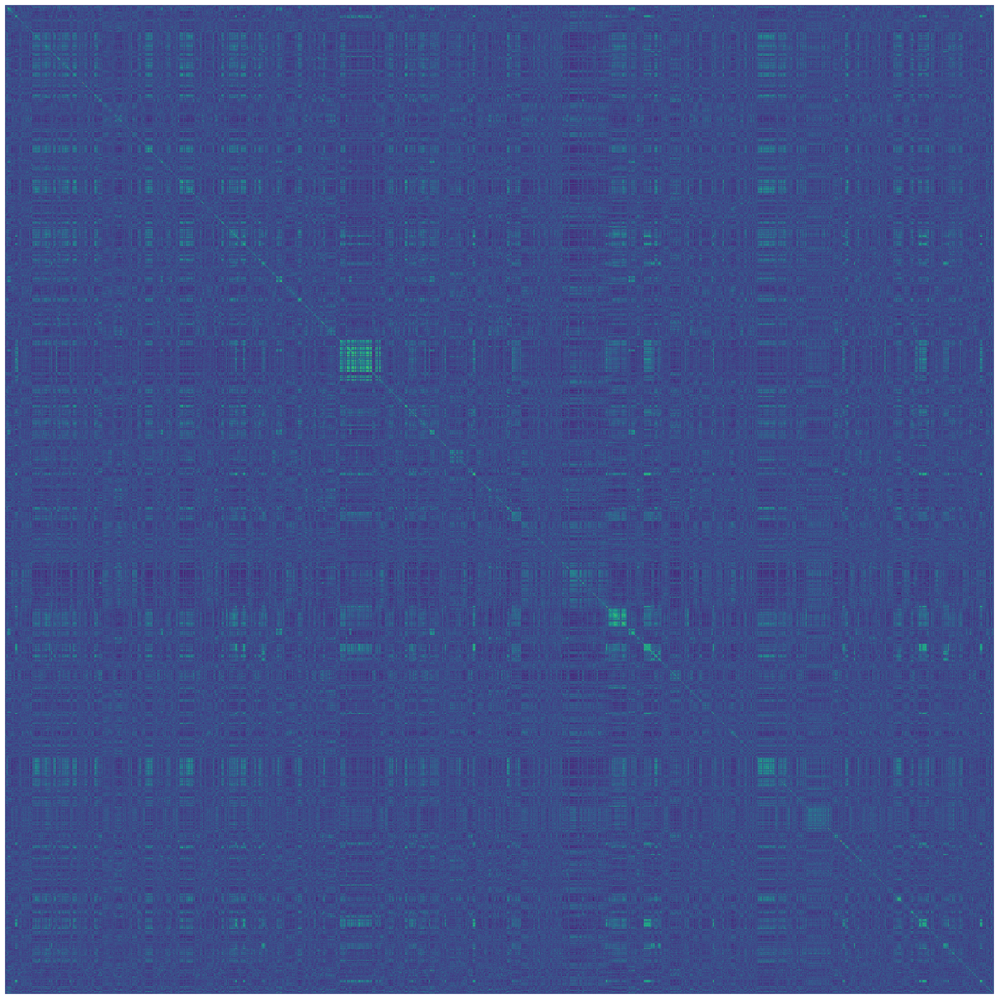

In [82]:
plt.figure(figsize=(20, 20))
plt.imshow(final_cos_sims, interpolation='nearest')
plt.axis('off')

plt.tight_layout()
plt.savefig("images/directed_heatmap.png", dpi=300)
plt.show()

From this heatmap, we can see see that there does seem to be a clear bit of semantic similarity within groups, but because there are so many groups, it is hard to tell just how related they are. It does seem roughly clear that most substacks are linking to others that are within similar topics since they have similar cosine similarities. The directedness also extracts smaller communities, but it should be clear that semantic similarity is somewhat clear. What if we tried it again with undirected version?

#### Between group (undirected)

In [23]:
UG = G.to_undirected()
un_comms = nx.community.louvain_communities(UG)
print('Extracted', len(un_comms), 'communities')

Extracted 58 communities


In [24]:
un_final_cos_sims = np.empty([len(un_comms), len(un_comms)])

un_all_group_embeds = []

for i in tqdm(range(len(un_comms))):
    i_idxs = np.array(list(un_comms[i]))
    i_group_embeds = new_embeds[i_idxs] 
    i_group_embeds = i_group_embeds / np.linalg.norm(i_group_embeds, axis=1)[:, None]
    un_all_group_embeds.append(i_group_embeds)

for i in tqdm(range(len(un_comms))):
    for j in range(i, len(un_comms)):
        if i == j:
            group_cos = np.triu(all_group_embeds[i] @ all_group_embeds[i].T)
            # Trying what happens if I don't fill diagonal (I definitely should)
            np.fill_diagonal(group_cos, 0)
            # NOTE: THis is actually deflated, since there are a lot of 0s
            # print(group_cos[np.nonzero(group_cos)])
            # break
            un_final_cos_sims[i, i] = np.mean(group_cos[np.nonzero(group_cos)])
        else:
            between_cos = all_group_embeds[i] @ all_group_embeds[j].T
            un_final_cos_sims[i, j] = np.mean(between_cos)
            un_final_cos_sims[j, i] = np.mean(between_cos)
            

100%|██████████| 58/58 [00:02<00:00, 22.60it/s]


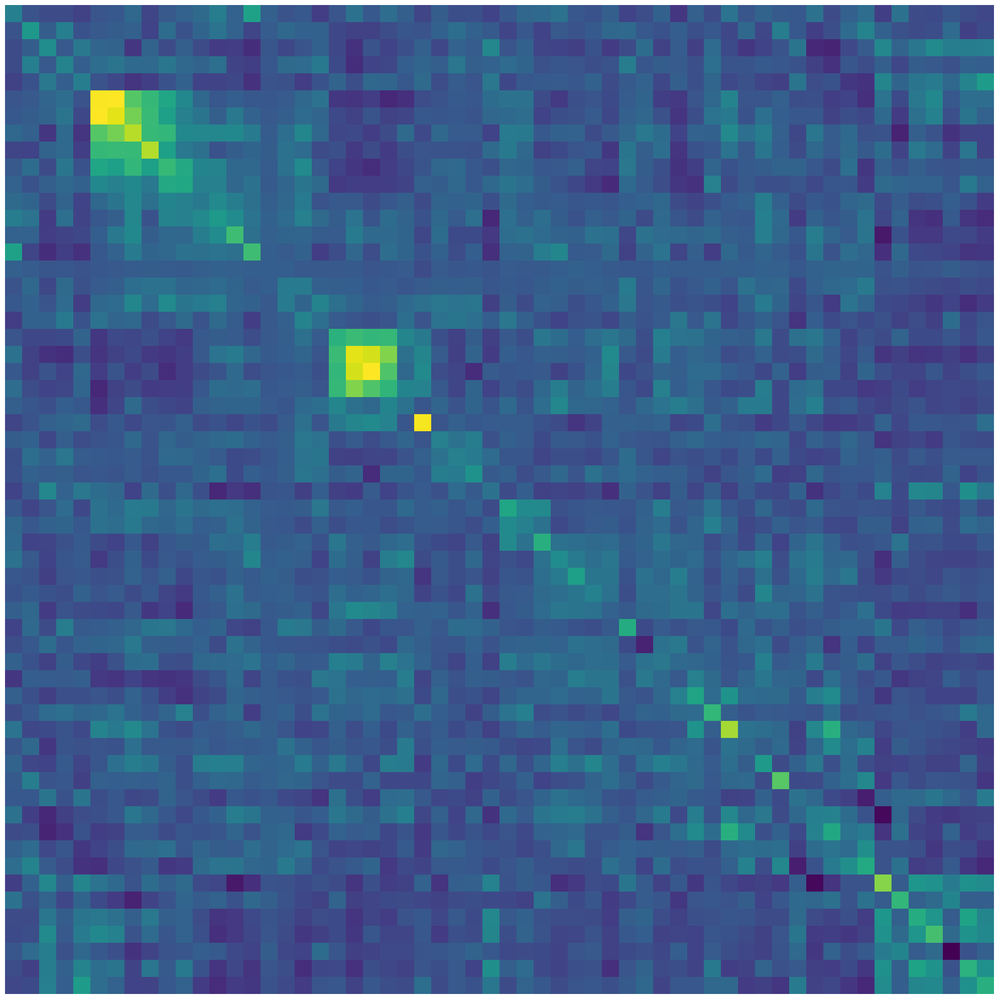

In [83]:
plt.figure(figsize=(20, 20))
plt.imshow(un_final_cos_sims, interpolation='nearest')
plt.axis('off')

plt.tight_layout()
plt.savefig("images/undirected_heatmap.png", dpi=300)
plt.show()

## Hidden Gems

The goal with this is to qualitatively evaluate whether the well recommended substacks with few subscribers actually delivered and go bigger within the last year.

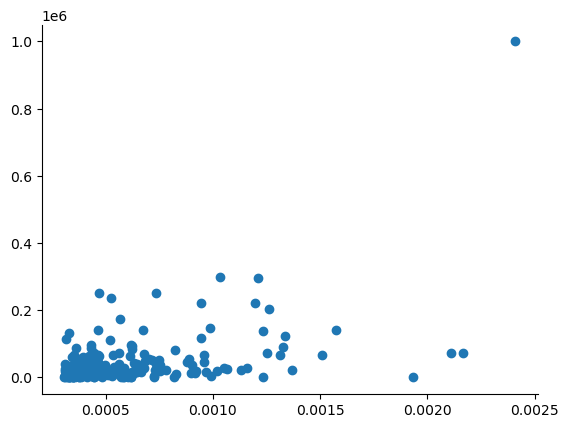

In [26]:
K_TO_EXTRACT = 250
ind = np.argpartition(corr_scores, -K_TO_EXTRACT)[-K_TO_EXTRACT:]
ind = ind[np.argsort(corr_subs[ind])]
plt.scatter(corr_scores[ind], corr_subs[ind])

# print(corr_subs[ind])
# print(np.argsort(corr_subs[ind]))
# print(ind[np.argsort(corr_subs[ind])]) # sort from small to large
# print(ind[np.argsort(corr_subs[ind])][::-1]) # print in reverse order
# ind = ind[np.argsort(corr_scores[ind])][::-1]
plt.show()

In [27]:
for i in ind:
    print(id_to_name[i], id_to_url[i], corr_scores[i], corr_subs[i])

Trouble Man: Musings of David Yaffe https://davidyaffe.substack.com/ 0.0007246675480406981 0
Dan Davies - "Back of Mind" https://backofmind.substack.com/ 0.0003331357638458522 0
For Dear Life with Maggie Smith https://maggiesmith.substack.com/ 0.00031805818491972593 0
Emerging Market Skeptic https://emergingmarketskeptic.substack.com/ 0.0003467639535052252 0
Story Hoarder https://storyhoarder.substack.com/ 0.0003465713335680114 0
VINTAGE MORELS  https://waynechristensen.substack.com/ 0.0004813449229277709 0
Jennifer Guerra https://jenniferguerra.substack.com/ 0.0003323784961224877 0
Counter Craft https://countercraft.substack.com/ 0.0003462589970461123 0
Three Things Weekly https://cocreatespace.substack.com/ 0.0005790685237775216 0
Sanjana’s Newsletter https://sanjanasingh.substack.com/ 0.00044352690819393647 0
The Abbey of Misrule https://paulkingsnorth.substack.com/ 0.0005833855732306142 0
Dess Writes https://gdess.substack.com/ 0.00032344983139678574 0
Iterations https://jefferysad

## Edge Prediction 

Hypothesis is, if groups are semantically similar, will we be able to predict edges purely from semantic content alone? Will it perform better than using the graph structure?

### Edge removal!

In [28]:
# TODO: Set flag of whether or not training dataset already exists, if it does, then DON'T DO THIS AGAIN
# Create dataset just one time
TRAIN_GRAPH_PATH = 'graphs/train_substack.adjlist'
TRAIN_EXTRACTED = (os.path.isfile(TRAIN_GRAPH_PATH))

if not TRAIN_EXTRACTED:
    N_EDGES_TO_REMOVE = 0.2 * G.number_of_edges()
    N_NODES = G.number_of_nodes()
    edges_removed = set()
    negative_samples = set()

    # TODO: Create a list of fake edges that don't have connection between
    while len(negative_samples) < N_EDGES_TO_REMOVE:
        u = random.randint(0, N_NODES-1)
        v = random.randint(0, N_NODES-1)
        if not G.has_edge(u, v) and (u, v) not in negative_samples:
            negative_samples.add((u, v))

    while len(edges_removed) < N_EDGES_TO_REMOVE:
        u = random.randint(0, N_NODES-1)
        v = random.randint(0, N_NODES-1)
        if G.has_edge(u, v):
            G.remove_edge(u, v)
            if nx.is_weakly_connected(G):
                edges_removed.add((u, v))
            else:
                G.add_edge(u, v)

    nx.write_adjlist(G, TRAIN_GRAPH_PATH)

    with open('edges_removed.txt', 'wb') as f:
        pickle.dump(edges_removed, f)

    with open('negative_samples.txt', 'wb') as f:
        pickle.dump(negative_samples, f)
else:
    with open('edges_removed.txt', 'rb') as f:
        edges_removed = pickle.load(f)

    with open('negative_samples.txt', 'rb') as f:
        negative_samples = pickle.load(f)

### Import Node2Vec Embeddings

In [38]:
# Read in first line which is N & K_dim
# Then for each, read in index, then stuff and put into numpy array
NODE2VEC_EMBEDDING_PATH = 'embed_store/embeddings'

with open(NODE2VEC_EMBEDDING_PATH, 'r') as f:
    header = f.readline()
    N, K = tuple(map(int, header.split(' ')))
    lines = str.splitlines(f.read())
    new_edge_embeds = np.empty([N, K])
    for line in lines:
        parts = line.split(' ')
        parts = list(map(float, parts))
        parts[0] = int(parts[0])
        row = parts[0]
        for i in range(1, len(parts)):
            new_edge_embeds[row, i-1] = parts[i]

print(N, K)

21372 128


### Real Edge Prediction Now!

Steps:

Input: List of edges, 2d matrix of embeds
- [x] Combine positive and negative into one big dataset
- [x] Split into test and train
- [x] Turn into edge embedding
- [x] Create result dataset (1 if exist, 0 if not)
- [x] Given list of embed/result, train model
- [x] Project into 2D and then visualize results
- [x] Write function to calculate accuracy

#### Create dataset & split

In [39]:
all_edges = [x for x in negative_samples]
all_labels = [0 for _ in negative_samples]
all_edges.extend([x for x in edges_removed])
all_labels.extend([1 for _ in edges_removed])

In [40]:
X_train, X_test, y_train, y_test = train_test_split(
    all_edges, all_labels, test_size=0.33, random_state=RANDOM_SEED)

In [41]:
# Creates feature dataset based off of which embeddings/operator you're using
def create_feature_dataset(embed_matrix, edge_list, operator):
    return [
        operator(embed_matrix[src], embed_matrix[dst])
        for (src, dst) in edge_list
    ]

# 2. training classifier
# SRC: https://stellargraph.readthedocs.io/en/stable/demos/link-prediction/node2vec-link-prediction.html#refs
def train_link_prediction_model(
    link_examples, link_labels, embed_matrix, operator 
):
    clf = link_prediction_classifier()
    link_features = create_feature_dataset(
        embed_matrix, link_examples, operator 
    )
    clf.fit(link_features, link_labels)
    return clf

def link_prediction_classifier(max_iter=2000):
    lr_clf = LogisticRegressionCV(Cs=10, cv=10, scoring="roc_auc", max_iter=max_iter)
    return Pipeline(steps=[("sc", StandardScaler()), ("clf", lr_clf)])

def evaluate_link_prediction_model(
    clf, link_examples_test, link_labels_test, embed_matrix, operator 
):
    link_features_test = create_feature_dataset(
        embed_matrix, link_examples_test, operator
    )
    score = evaluate_roc_auc(clf, link_features_test, link_labels_test)
    return score

def evaluate_roc_auc(clf, link_features, link_labels):
    predicted = clf.predict_proba(link_features)

    # check which class corresponds to positive links
    positive_column = list(clf.classes_).index(1)
    return roc_auc_score(link_labels, predicted[:, positive_column])

In [42]:
def run_link_prediction(embed_matrix, matrix_name, binary_operator):
    clf = train_link_prediction_model(
        X_train, y_train, embed_matrix, binary_operator
    )
    score = evaluate_link_prediction_model(
        clf,
        X_test,
        y_test,
        embed_matrix,
        binary_operator,
    )

    return {
        "classifier": clf,
        "binary_operator": binary_operator,
        "embedding": matrix_name,
        "score": score,
    }

# Embedding combining operators
def operator_hadamard(u, v):
    return u * v

def operator_l1(u, v):
    return np.abs(u - v)


def operator_l2(u, v):
    return (u - v) ** 2


def operator_avg(u, v):
    return (u + v) / 2.0

binary_operators = [operator_hadamard, operator_l1, operator_l2, operator_avg]

In [43]:
semantic_results = [run_link_prediction(new_embeds, 'semantic', op) for op in binary_operators]
semantic_best_result = max(semantic_results, key=lambda result: result["score"])

print(f"Best result for semantic from '{semantic_best_result['binary_operator'].__name__}'")

pd.DataFrame(
    [(result["binary_operator"].__name__, result["score"]) for result in semantic_results],
    columns=("name", "Semantic ROC AUC score"),
).set_index("name")

Best result for semantic from 'operator_l2'


,Semantic ROC AUC score
name,
operator_hadamard,0.838929
operator_l1,0.836212
operator_l2,0.843072
operator_avg,0.669145


In [44]:
node_results = [run_link_prediction(new_edge_embeds, 'node2vec', op) for op in binary_operators]

node_best_result = max(node_results, key=lambda result: result["score"])

print(f"Best result for Node2Vec from '{node_best_result['binary_operator'].__name__}'")

pd.DataFrame(
    [(result["binary_operator"].__name__, result["score"]) for result in node_results],
    columns=("name", "Node2Vec ROC AUC score"),
).set_index("name")

Best result for Node2Vec from 'operator_l2'


,Node2Vec ROC AUC score
name,
operator_hadamard,0.909764
operator_l1,0.954361
operator_l2,0.954821
operator_avg,0.743093


In [88]:
combined_embeds = np.concatenate((new_edge_embeds, new_embeds), axis=1)

combined_results = [run_link_prediction(combined_embeds, 'node2vec', op) for op in binary_operators]

combined_best_result = max(combined_results, key=lambda result: result["score"])

print(f"Best result for Combined from '{combined_best_result['binary_operator'].__name__}'")

pd.DataFrame(
    [(result["binary_operator"].__name__, result["score"]) for result in combined_results],
    columns=("name", "Node2Vec/Semantic ROC AUC score"),
).set_index("name")

Best result for Combined from 'operator_l1'


,Node2Vec/Semantic ROC AUC score
name,
operator_hadamard,0.933380
operator_l1,0.965010
operator_l2,0.964367
operator_avg,0.755064


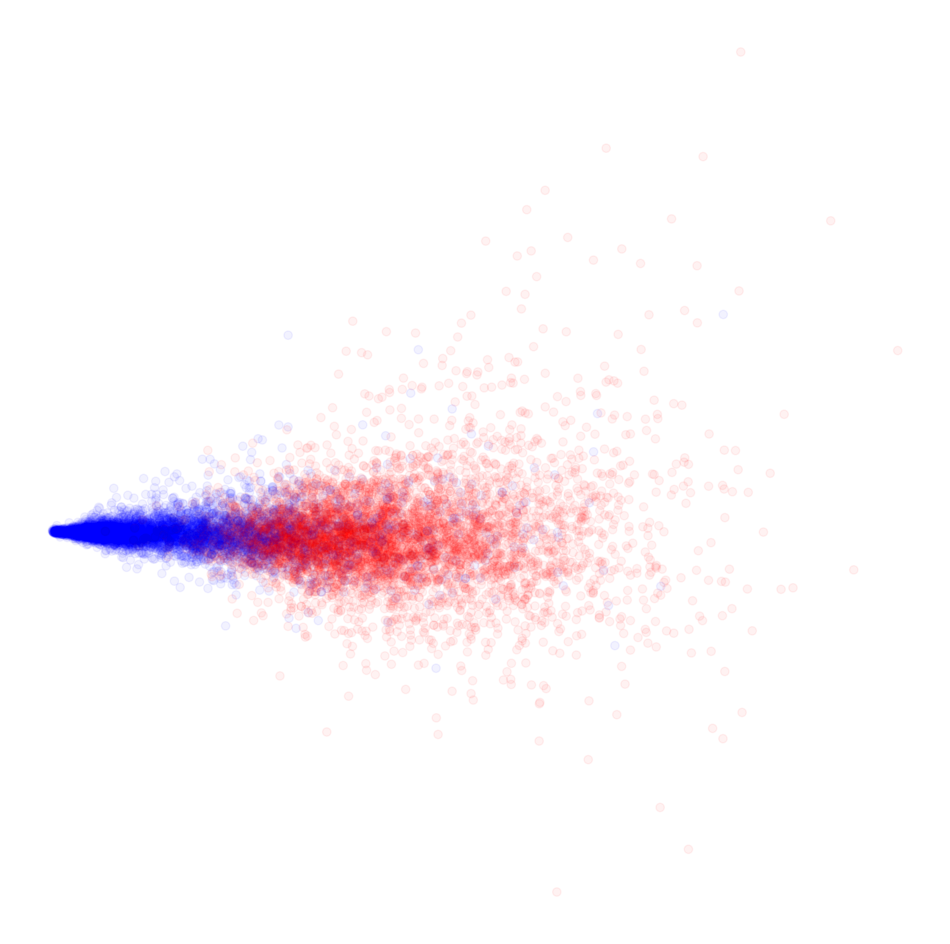

In [52]:
# Calculate edge features for test data
link_features = create_feature_dataset(
    new_edge_embeds, X_test, node_best_result["binary_operator"]
)

# Learn a projection from 128 dimensions to 2
pca = PCA(n_components=2)
X_transformed = pca.fit_transform(link_features)

# plot the 2-dimensional points
plt.figure(figsize=(12, 12))
plt.scatter(
    X_transformed[:, 0],
    X_transformed[:, 1],
    c=np.where(np.array(y_test) == 1, "b", "r"),
    alpha=0.05,
)

plt.axis('off')
plt.savefig("images/node_pca_out.png", dpi=300)
plt.show()